In [1]:

import numpy as np
import pandas as pd 


image_dict = dict()

import os
for dirname, _, filenames in os.walk('./'):
    if dirname == './monet':
        image_dict['monet_jpg'] = (dirname, filenames)
    elif dirname == './photo':
        image_dict['photo_jpg'] = (dirname, filenames)



In [2]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim 
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

In [3]:
def same_padding(kernal_size):
  import math
  return math.floor((kernal_size - 1) / 2)

In [4]:
def show_tensor_images(image_tensor, num_images=5, size=(100, 100)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    from torchvision.utils import make_grid
    image_unflat = image_tensor.detach().cpu()
    select_img = image_unflat[:num_images]

    if select_img.type() == 'torch.HalfTensor':
        select_img = select_img.to(torch.float32)
    image_grid = make_grid(select_img, nrow=5)
    plt.figure(figsize = size)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [5]:
class ImageDataSet(Dataset):
    
    def __init__(self, monet_photo, real_photo, transform = None, device = 'cpu'):
        self.monet_photo_dir= monet_photo[0]
        self.monet_image = monet_photo[1] #all the image name array
        self.photo_dir = real_photo[0]
        self.photo = real_photo[1]
        self.transform = transform
        self.device = device
        self.length = max(len(monet_photo[1]), len(real_photo[1]))
        
    def __len__(self):
        return self.length
    
    def __getitem__(self, index):

        monet_img = plt.imread(self.monet_photo_dir + '/' + self.monet_image[index % len(self.monet_image)])
        photo_img = plt.imread(self.photo_dir + '/' + self.photo[index % len(self.photo)])

        if self.transform:
            monet_img = self.transform(monet_img)
            photo_img = self.transform(photo_img)
            monet_img = monet_img.to(self.device)
            photo_img = photo_img.to(self.device)

        
        return {'monet': monet_img, 'photo': photo_img}
        
        
        

In [6]:
class ResNetBlock(nn.Module):
    def __init__(self):
        super(ResNetBlock, self).__init__()
        self.conv1 = nn.Conv2d(256,256,kernel_size=3,padding=same_padding(3))
        self.relu = nn.ReLU(inplace = True)
        self.inorm = nn.InstanceNorm2d(256)
    
    def forward(self, x):
        residual = x
        out = self.conv1(x)
        out = self.inorm(x)
        out += residual 
        return self.relu(out)
        

In [7]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.downsampleblock = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size = 7, stride=1, padding=same_padding(7)),
            nn.ReLU(inplace = True),
            nn.InstanceNorm2d(64),
            nn.Conv2d(64, 128, kernel_size = 3, stride=2, padding=same_padding(3)),
            nn.ReLU(inplace = True),
            nn.InstanceNorm2d(128),
            nn.Conv2d(128, 256, kernel_size = 3, stride=2, padding=same_padding(3)),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace = True),
        )
        self.transformer = nn.ModuleList([ResNetBlock() for _ in range(6)])
        self.upsample = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(256, 128, kernel_size = 3, padding=same_padding(3)),
            nn.ReLU(inplace = True),
            nn.InstanceNorm2d(128),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 64, kernel_size = 3, padding=same_padding(3)),
            nn.ReLU(inplace = True),
            nn.InstanceNorm2d(64),
            nn.Conv2d(64, 3, kernel_size = 7, padding=same_padding(7)),
            nn.Sigmoid()
        )
    
    
    def forward(self, x):
        residual = x
        out = self.downsampleblock(x)
        for block in self.transformer:
            out = block(out)
        out = self.upsample(out)
        return out



In [8]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block1 = self.gen_conv_block(3, 6, stride=2)
        self.block2 = self.gen_conv_block(6,12,stride=2)
        self.block3 = self.gen_conv_block(12,24,stride=2)
        self.block5 = self.gen_conv_block(24,6)
        self.zeropad = nn.ZeroPad2d(1)
        self.block6 = self.gen_conv_block(6,3,padding=0)
        self.block7 = self.gen_conv_block(3,1,padding=0, final_layer=True)
        
        
    
    def gen_conv_block(self, input_channel, output_channel, kernel_size=3, stride=1, padding= same_padding(3), final_layer=False):
        if final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channel, output_channel, kernel_size = kernel_size, stride = stride, padding=padding),
                nn.Sigmoid()
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channel, output_channel, kernel_size = kernel_size, stride = stride, padding=padding),
                nn.ReLU(inplace = True),
                nn.BatchNorm2d(output_channel),

            )
    
    
    def forward(self,x):
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block5(x)
        x = self.zeropad(x)
        x = self.block6(x)
        x = self.block7(x)
        return x
    

In [9]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"
print(device)

cuda:0


In [10]:
transform = transforms.Compose([
        transforms.ToTensor(),
        ])

In [11]:
Dataset_train = ImageDataSet(image_dict['monet_jpg'], image_dict['photo_jpg'], transform = transform, device=device)

In [12]:
TrainDataLoader = DataLoader(Dataset_train, batch_size = 5, shuffle = True)

In [13]:
torch.cuda.empty_cache()


GeneratorM1 = Generator().to(device)  #use to transform non style image into style image  X->Y
GeneratorP1 = Generator().to(device) #use to transform style image back to non style image Y->X
DiscriminatorM1 = Discriminator().to(device) #Use to check if it's style image or not
DiscriminatorP1 = Discriminator().to(device) #Use to check if it's real image or not

mse = nn.MSELoss()
l1loss = nn.L1Loss()
optimG = optim.Adam(list(GeneratorM1.parameters()) + list(GeneratorP1.parameters()), lr=0.0002, betas=(0.5,0.999))

optimD = optim.Adam(list(DiscriminatorM1.parameters()) + list(DiscriminatorP1.parameters()), lr=0.00015, betas=(0.5,0.999))


c:\users\jimmy\appdata\local\programs\python\python38\lib\site-packages\torchvision\transforms\functional.py:114: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  ..\torch\csrc\utils\tensor_numpy.cpp:143.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()


Finish 1 epoch


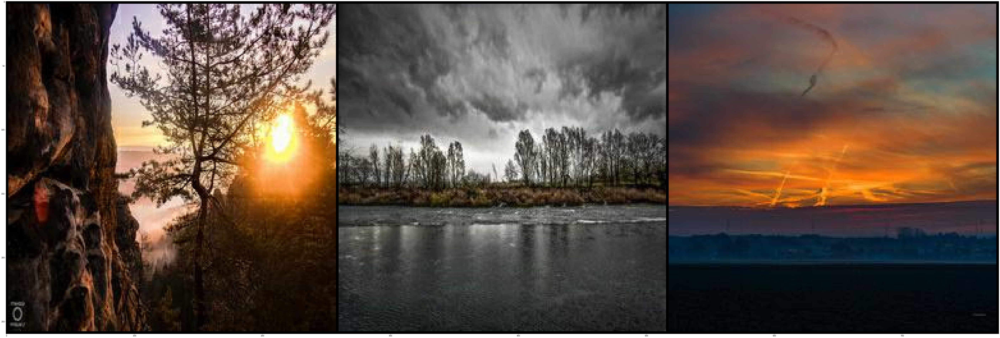

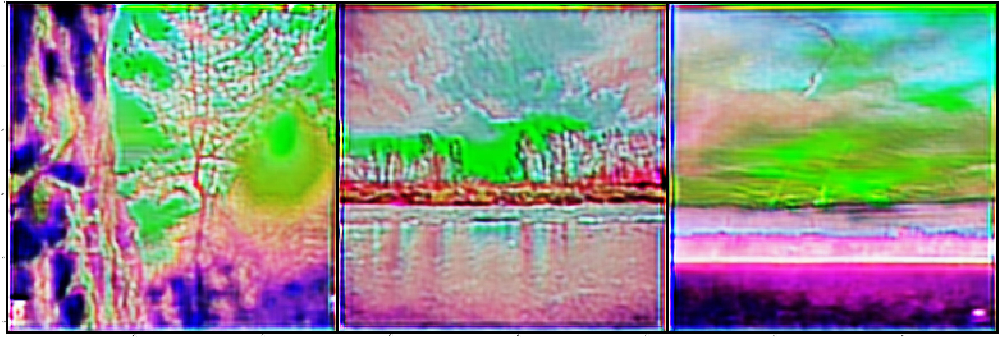

0.19677191972732544 loss of discriminator monet
0.39693325757980347 loss of discriminator photo
0.511267900466919 loss of monet generator
0.3276425898075104 loss of photo generator
0.1189950555562973 cycle loss of photo
0.0737050473690033 cycle loss of monet
Finish 2 epoch


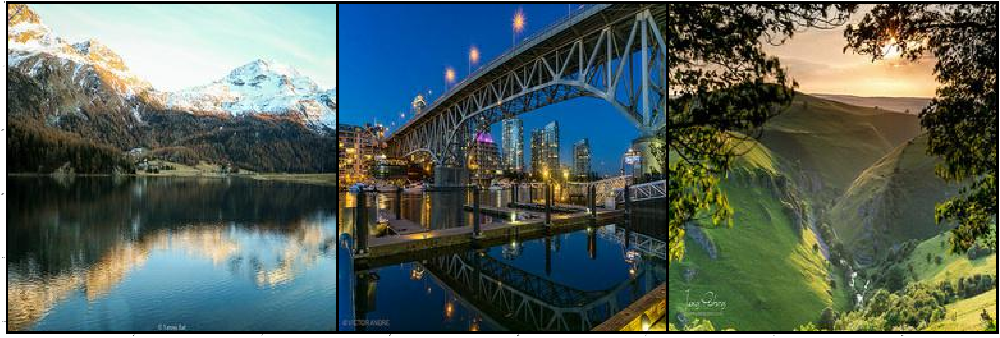

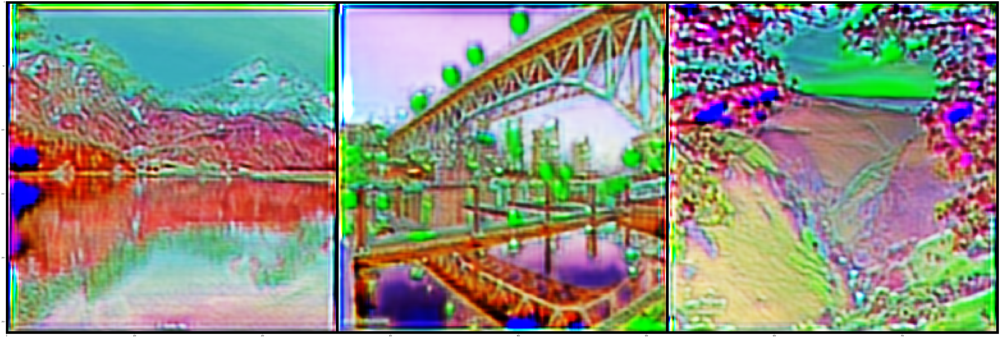

0.045696988701820374 loss of discriminator monet
0.4358496069908142 loss of discriminator photo
0.7516226172447205 loss of monet generator
0.3191685676574707 loss of photo generator
0.09253017604351044 cycle loss of photo
0.0797441378235817 cycle loss of monet
Finish 3 epoch


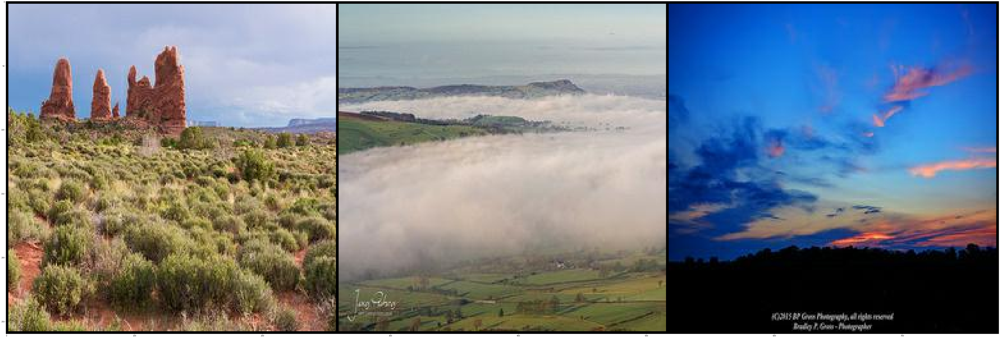

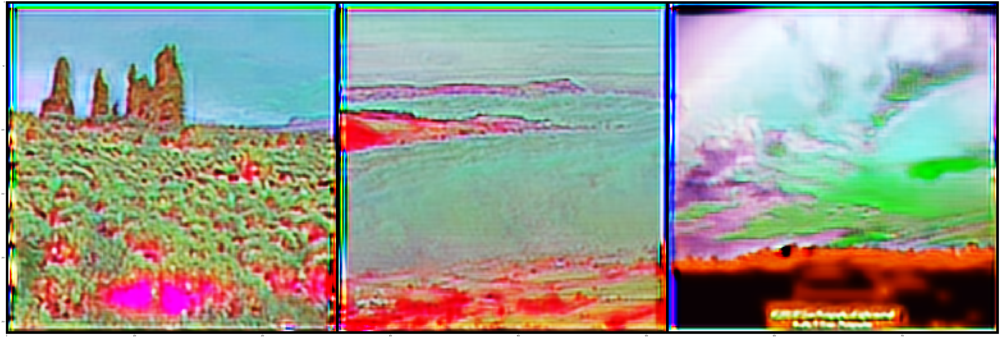

0.015628505498170853 loss of discriminator monet
0.36798906326293945 loss of discriminator photo
0.8558526039123535 loss of monet generator
0.3431684076786041 loss of photo generator
0.06455941498279572 cycle loss of photo
0.07131090015172958 cycle loss of monet
Finish 4 epoch


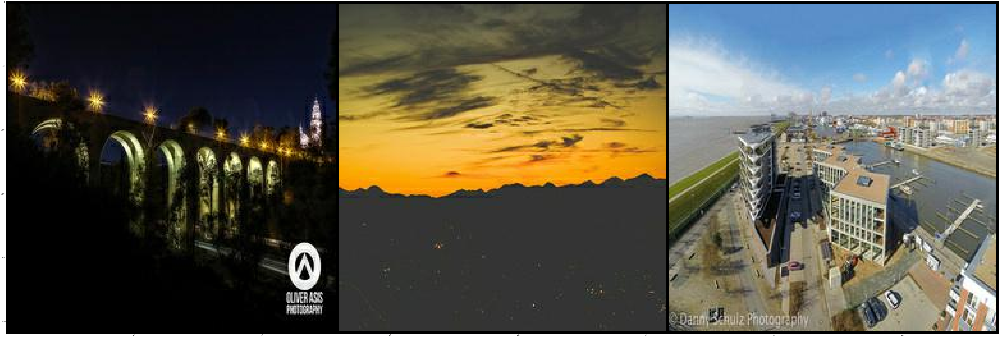

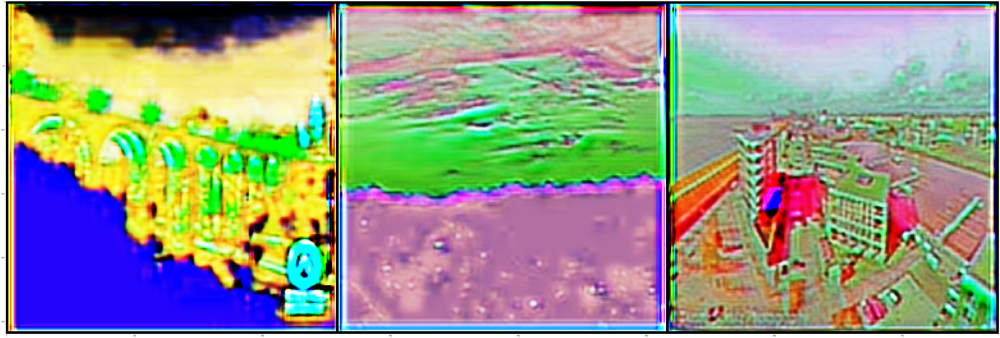

0.005098898895084858 loss of discriminator monet
0.40440285205841064 loss of discriminator photo
0.906319260597229 loss of monet generator
0.3107651174068451 loss of photo generator
0.06449419260025024 cycle loss of photo
0.0777355283498764 cycle loss of monet
Finish 5 epoch


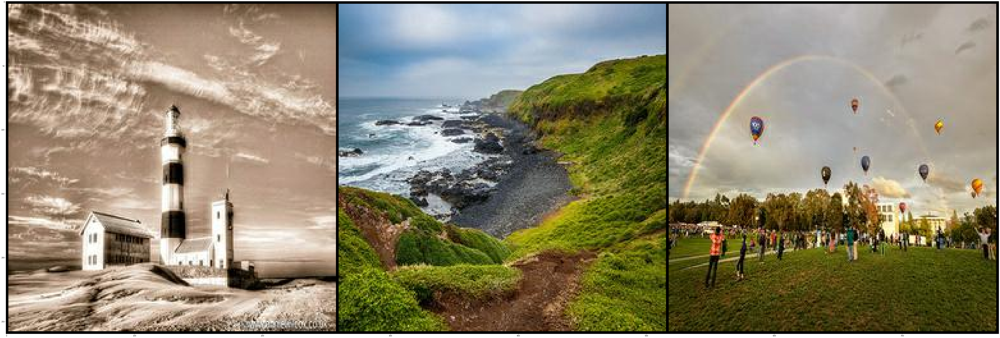

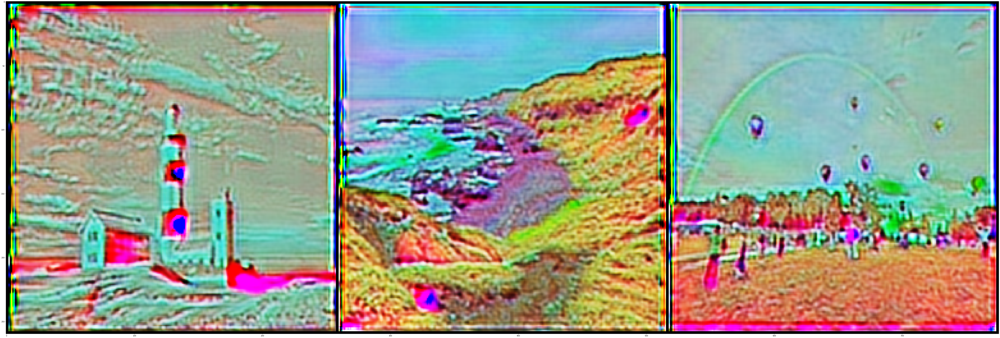

0.0021750186569988728 loss of discriminator monet
0.5421656370162964 loss of discriminator photo
0.9387848973274231 loss of monet generator
0.29753705859184265 loss of photo generator
0.04807901382446289 cycle loss of photo
0.06051895394921303 cycle loss of monet
Finish 6 epoch


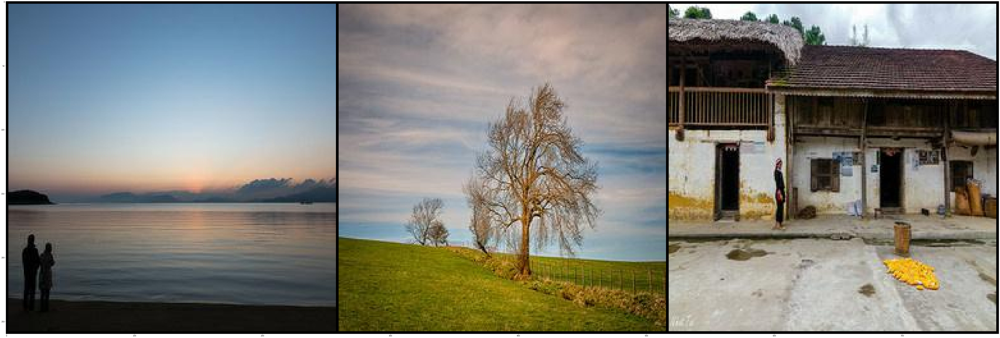

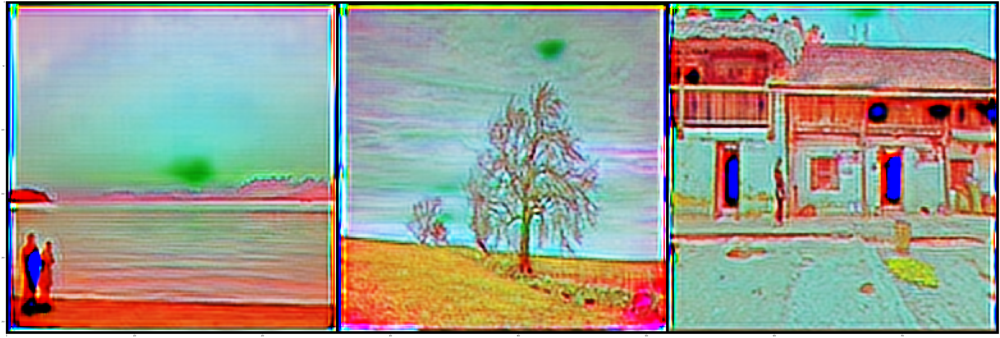

0.0009705504635348916 loss of discriminator monet
0.46927788853645325 loss of discriminator photo
0.9571419358253479 loss of monet generator
0.3176690936088562 loss of photo generator
0.049887705594301224 cycle loss of photo
0.049244437366724014 cycle loss of monet
Finish 7 epoch


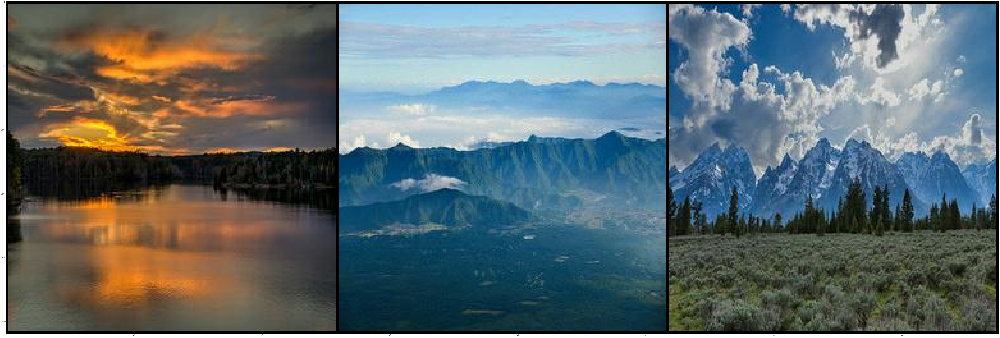

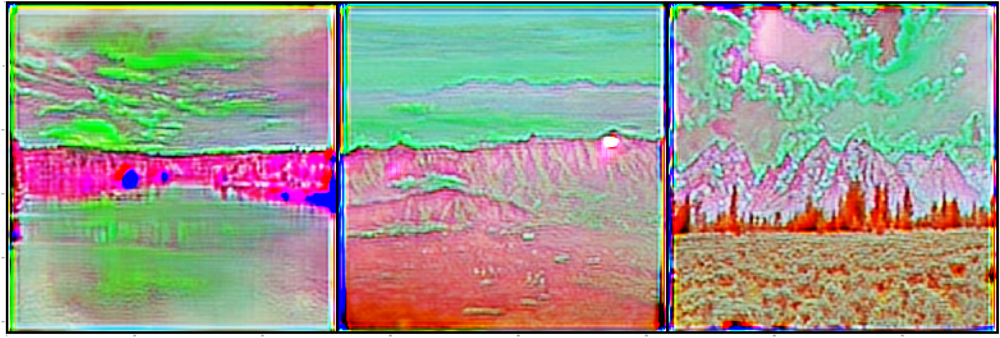

0.0004597843799274415 loss of discriminator monet
0.4829857349395752 loss of discriminator photo
0.9719834923744202 loss of monet generator
0.27037313580513 loss of photo generator
0.04027758166193962 cycle loss of photo
0.049020882695913315 cycle loss of monet


KeyboardInterrupt: 

In [14]:
epochs = 20
lambda1 = 10

Dscaler = torch.cuda.amp.GradScaler()
Gscaler = torch.cuda.amp.GradScaler()

for i in range(epochs):
    for index, val in enumerate(TrainDataLoader):
        
        monet_img, photo_img = val['monet'], val['photo']

            #Train the discriminator first for monet
        
        with torch.cuda.amp.autocast():
            fake_monet = GeneratorM1(photo_img) #fake monet image generate from photo


            fakedis_m = DiscriminatorM1(fake_monet.detach()) # Discriminator try to classify if image is monet or not

            realdis_m = DiscriminatorM1(monet_img) 

            loss_d_m_f = mse(fakedis_m, torch.zeros_like(fakedis_m))
            loss_d_m_r = mse(realdis_m, torch.ones_like(realdis_m))

            loss_d_m = loss_d_m_f + loss_d_m_r

        
        
            #Train the discriminator first here as well for photo

            fake_photo = GeneratorP1(monet_img)

            fakedis_p = DiscriminatorP1(fake_photo.detach())
            realdis_p = DiscriminatorP1(photo_img)

            loss_d_p_f = mse(fakedis_p, torch.zeros_like(fakedis_p))
            loss_d_p_r = mse(realdis_p, torch.ones_like(realdis_p))
            loss_d_p = loss_d_p_f + loss_d_p_r

            D_loss = (loss_d_m + loss_d_p) / 2
        
        
        optimD.zero_grad()
        Dscaler.scale(D_loss).backward()
        Dscaler.step(optimD)
        Dscaler.update()
        

        
        #Now train the generator
        
        with torch.cuda.amp.autocast():
        
            d_m_fake = DiscriminatorM1(fake_monet)
            d_p_fake = DiscriminatorP1(fake_photo)

            GM_loss = mse(d_m_fake, torch.ones_like(d_m_fake))
            GP_loss = mse(d_p_fake, torch.ones_like(d_p_fake))

            cycle_back_photo = GeneratorP1(fake_monet) #turn the fake image back to the real image
            cycle_back_monet = GeneratorM1(fake_photo)

            cycle_loss_M = l1loss(photo_img, cycle_back_photo)
            cycle_loss_P = l1loss(monet_img, cycle_back_monet)

            #identity_M = GeneratorM1(monet_img)
            #identity_P = GeneratorP1(photo_img)

            #identity_M_loss = l1loss(monet_img, identity_M)
            #identity_P_loss = l1loss(photo_img, identity_P)

            G_loss = lambda1 * (cycle_loss_M + cycle_loss_P) + GM_loss + GP_loss # + identity_M_loss + identity_P_loss
            #G_loss = lambda1 * (cycle_loss_M + cycle_loss_P)

        
        optimG.zero_grad()
        Gscaler.scale(G_loss).backward()
        Gscaler.step(optimG)
        Gscaler.update()
        

    print('Finish {} epoch'.format(i+1))
    show_tensor_images(photo_img, 5)
    show_tensor_images(fake_monet, 5)
    print(loss_d_m.item(), 'loss of discriminator monet')
    print(loss_d_p.item(), 'loss of discriminator photo')
    print(GM_loss.item(), 'loss of monet generator')
    print(GP_loss.item(), 'loss of photo generator')
    print(cycle_loss_P.item(), 'cycle loss of photo')
    print(cycle_loss_M.item(), 'cycle loss of monet')
    #print(identity_M_loss.item(), 'identity loss Monet')
    #print(identity_P_loss.item(), 'identity photo loss')

In [17]:
PATH = "cycle_gan.pt"
torch.save({
    'epoch': i + 1,
    'generatorM_state_dict': GeneratorM1.state_dict(),
    'generatorP_state_dict': GeneratorP1.state_dict(),
    'DiscriminatorM_state_dict': DiscriminatorM1.state_dict(),
    'DiscriminatorP_state_dict': DiscriminatorP1.state_dict(),
    'GeneratorOptimizer': optimG.state_dict(),
    'DiscriminatorOptimizer': optimD.state_dict(),
    'loss_D': D_loss,
    'loss_G': G_loss,
    'Scaler_D': Dscaler.state_dict(),
    'Scaler_G': Gscaler.state_dict(),
    
}, PATH)